In [1]:
!pip install torchinfo

import warnings
warnings.filterwarnings('ignore')

import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image
from tqdm import tqdm
%matplotlib inline

# Visual adjustment
#np.set_printoptions(precision=6, linewidth=1024, suppress=True)
#plt.style.use('seaborn')
#sns.set(style='darkgrid', context='notebook',font_scale=1.10)

# Pytorch
import torch
gpu_available = torch.cuda.is_available()
print('Using Pytorch version %s. GPU %s available' % (torch.__version__, "IS" if gpu_available else "IS **NOT**"))
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch import optim
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR
from torchinfo import summary

# to ensure that you get consistent results
# @see: https://discuss.pytorch.org/t/reproducibility-over-different-machines/63047
seed = 123
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed);

if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.enabled = False


[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Using Pytorch version 2.4.0+cu121. GPU IS **NOT** available


# EDA: Exploratory Data Analysis
First, let's check the provided csv file.

In [2]:
DATA_FOLDER = '/kaggle/input/histopathologic-cancer-detection/'
df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [3]:
# How many images & labels do we have.
df.shape

(220025, 2)

In [4]:
# Checking if there were any null;
len(df[df.isnull().any(axis=1)])

0

Let's check the distribution of target labels.

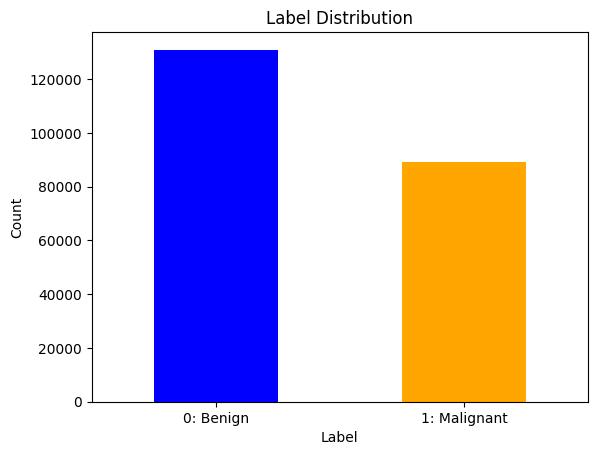

In [5]:
# Let's check the distribution of target labels
ax = df['label'].value_counts().plot(kind='bar', color=['blue', 'orange'])

ax.set_xticks([0, 1])
ax.set_xticklabels(['0: Benign', '1: Malignant'])
plt.xticks(rotation=0)
ax.set_xlabel('Label')
ax.set_ylabel('Count')
ax.set_title('Label Distribution')

plt.show()

In [6]:
# Let's save the benign & malignant counts
num_benign, num_malignant = np.bincount(df['label'])
print(f"Found {num_benign} Benign cases, and {num_malignant} Malignant cases in dataset")

Found 130908 Benign cases, and 89117 Malignant cases in dataset


# Data Preprocessing

## Function: Generating Subset of Dataset 

We will split our 'Train' data into three subset, namely X_train, X_val, and X_test.  
In the cell below, 'get_data' function is to generate meta data from the provided csv file, to attach/call the actual image dataset.

In [7]:
def get_data():
    df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
    ax = df['label'].value_counts().plot(kind='bar', color=['blue', 'orange'])

    ax.set_xticks([0, 1])
    ax.set_xticklabels(['0: Benign', '1: Malignant'])
    plt.xticks(rotation=0)
    ax.set_xlabel('Label')
    ax.set_ylabel('Count')
    ax.set_title('Label Distribution')
    
    plt.show()
    
    # Shuffle the dataframe
    df = df.sample(frac=1).reset_index(drop=True)
    print(f'Found {len(df[df.isnull().any(axis=1)])} after shuffling')
    
    # split into train/cross-val/test datasets (use stratify so we get a similar distribution)
    image_ids, labels = df['id'], df['label']
    X_train, X_test, y_train, y_test = \
      train_test_split(image_ids, labels, test_size=0.30, random_state=seed, stratify=labels)
    X_val, X_test, y_val, y_test = \
      train_test_split(X_test, y_test, test_size=0.20, random_state=seed, stratify=y_test)
    print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)
    
    X_train_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_train.values]
    X_val_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_val.values]
    X_test_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_test.values]

    return (X_train_image_paths, y_train.values, X_train.values), \
           (X_val_image_paths, y_val.values, X_val.values), \
           (X_test_image_paths, y_test.values, X_test.values)

## Function: Displaying Sample Images 

In [8]:
def display_sample(sample_images, sample_labels, sample_predictions=None, grid_shape=(8, 8), 
                   plot_title=None, fig_size=None):
    """ 
    display a random selection of images & corresponding labels, optionally with predictions
    The display is laid out in a grid of num_rows x num_col cells
    If sample_predictions are provided, then each cell's title displays the prediction
    (if it matches actual) or actual/prediction if there is a mismatch
    """
    num_rows, num_cols = grid_shape
    assert len(sample_images) == num_rows * num_cols

    # a dict to help encode/decode the labels 
    LABELS = {
        1: 'Malignant',
        0: 'Benign'
    }

    with sns.axes_style("whitegrid"):
        sns.set_context("notebook", font_scale=1.1)
        sns.set_style({"font.sans-serif": ["Verdana", "Arial", "Calibri", "DejaVu Sans"]})
        
        f, ax = plt.subplots(num_rows, num_cols, figsize=((20, 20) if fig_size is None else fig_size),
                            gridspec_kw={"wspace": 0.02, "hspace": 0.25}, squeeze=True)
        # fig = ax[0].get_figure()
        f.tight_layout()
        f.subplots_adjust(top=0.95)

        for r in range(num_rows):
            for c in range(num_cols):
                image_index = r * num_cols + c
                ax[r, c].axis("off")

                # show selected image
                sample_image = sample_images[image_index]
                # got image as (NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH)
                sample_image = sample_image.transpose((1, 2, 0))
                # sample_image = sample_image * 0.5 + 0.5  # since we applied this normalization
                # sample_image *= 255.0

                ax[r, c].imshow(sample_image)

                if sample_predictions is None:
                    # show the actural labels in the cell title
                    title = ax[r, c].set_title("%s" % LABELS[sample_labels[image_index]])
                else:
                    # else check if prediction matches actual value
                    true_label = sample_labels[image_index]
                    pred_label = sample_predictions[image_index]
                    prediction_matches_true = (true_label == pred_label)
                    if prediction_matches_true:
                        # if actual == prediction, cell title is prediction shown in green frot
                        title = LABELS[true_label]
                        title_color = 'g'
                    else:
                        # if actual != prediction, cell title is actual/predictino in red font
                        title = '%s\n%s' % (LABELS[true_label], LABELS[pred_label])
                        title_color = 'r'
                    # display cell title
                    title = ax[r, c].set_title(title)
                    plt.setp(title, color=title_color)
        # set plot title, if one specified
        if plot_title is not None:
            f.suptitle(plot_title)

        plt.show()
        plt.close()

## Class dataset: Pairing Image Files with labels and the Meta Data 
A dataset is a class that keeps input data and labels together.  
Also, it will contain the meta data information such as ids, and the data transformations information in order for data augmentation.

In [9]:
class HistoDataset(Dataset):
    def __init__(self, image_paths, labels=None, ids=None, transforms=None):
        self.image_paths = image_paths
        self.labels = labels
        self.ids = ids
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        """
        Open a PIL image, apply transforms (if any) & convert to Numpy array
        and return array and label at index
        """
        image_path = self.image_paths[index]
        img = Image.open(image_path)

        img = self.transforms(img)

        img_id = self.ids[index]
        
        if self.labels is not None:
            label = self.labels[index]
            return img, label, img_id     
        
        return img, img_id 

## Data Augmentation
To enhance the robustness of our model, we will train it not only with the original image datasets but also with augmented data, including rotated, flipped, scaled, and resized images.
Most importantly, the imagshasd to be converted into tensors foroure model to learnity.
Torchvision''s transforms.Compo'se can sequentially and stochastically apply these transformation.

In [10]:
# We are scaling all images to same size + converting them to tensors & normalizing data
xforms = {
    'train': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(25),
        transforms.RandomResizedCrop(96,scale=(0.8,1.0),ratio=(1.0,1.0)),
        transforms.ToTensor(),
        # transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ]),
    'eval': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),    
    'test': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),
}

## Setting dataset for the dataloader  
Now we actually are pairing the image data to its meta data with the function 'HistoDataset()'.  
Note, all the datasets in the below cell are originated from 'Train' data only.  
We will touch the 'real' test dataset (/kaggle/input/test) when to submit our output.

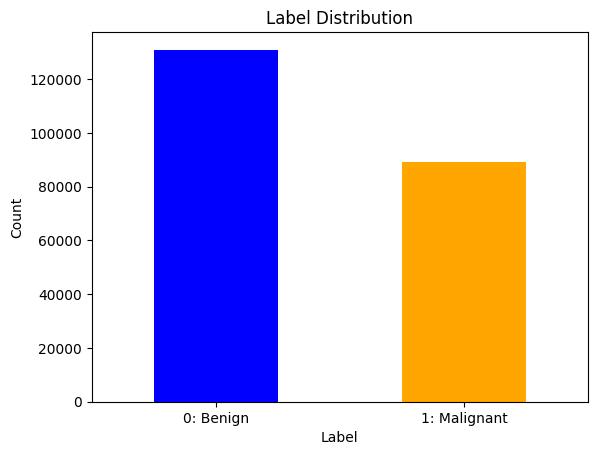

Found 0 after shuffling
(154017,) (154017,) (52806,) (52806,) (13202,) (13202,)


In [11]:
# Define our datasets
# Load data
(X_train_paths, y_train, train_ids), (X_val_paths, y_val, val_ids), (X_test_paths, y_test, test_ids) = get_data()

train_dataset = HistoDataset(X_train_paths, y_train, train_ids, xforms['train'])
eval_dataset = HistoDataset(X_val_paths, y_val, val_ids, xforms['eval'])
test_dataset = HistoDataset(X_test_paths, y_test, test_ids, xforms['test'])

Dataset: image.shape = torch.Size([64, 3, 96, 96]), labels.shape = torch.Size([64])


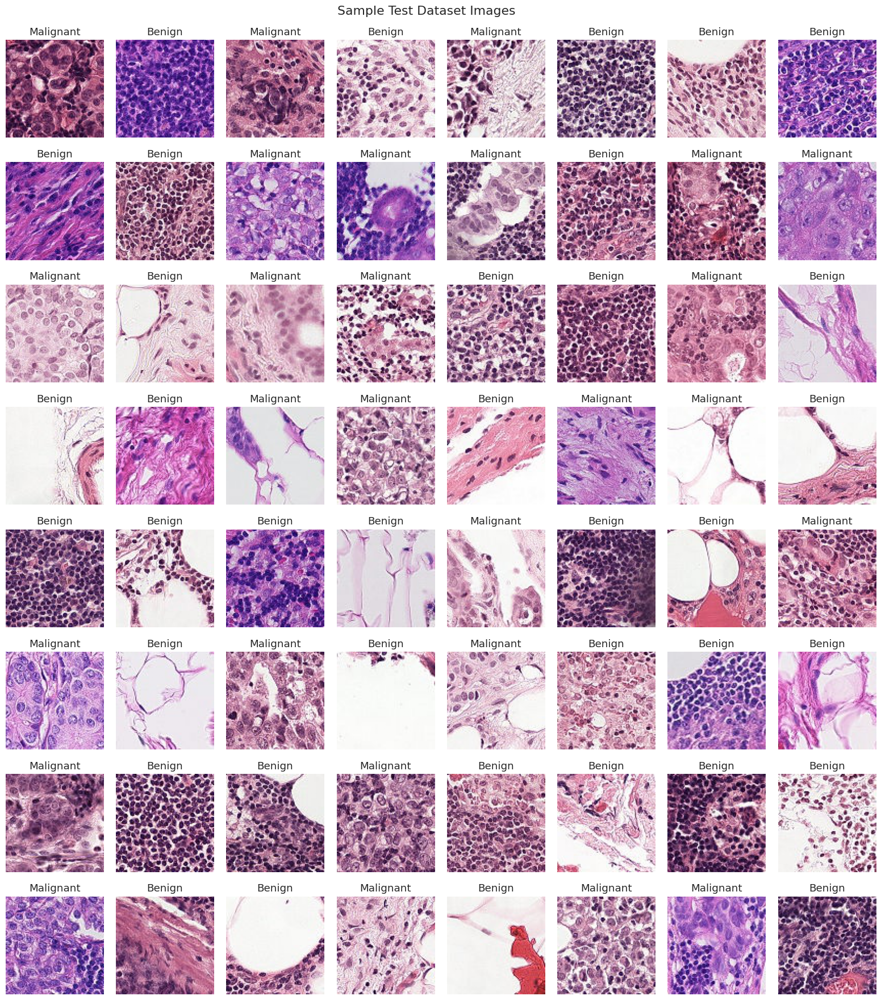

In [12]:
# Let's view a sample of 64 images 
loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(loader)
sample_images, sample_labels, _ = next(data_iter)  # fetch first batch of 64 images & labels
print(f'Dataset: image.shape = {sample_images.shape}, labels.shape = {sample_labels.shape}')
display_sample(sample_images.cpu().numpy(), sample_labels.cpu().numpy(), plot_title="Sample Test Dataset Images");     

# Data Loader
DataLoader will generate mini-batches from the dataset instances.

In [13]:
BATCH_SIZE = 6144
num_workers = 48

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

# Function: Building the Model

In [14]:
def build_model():
    net = nn.Sequential(
        nn.Conv2d(NUM_CHANNELS, 8, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(8),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(8, 16, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(16, 32, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(32),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(32, 64, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(64),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Flatten(),
        
        nn.Linear(64*4*4, 512),
        nn.ReLU(),
        nn.Dropout(0.25),
        
        nn.Linear(512, NUM_CLASSES),
        nn.LogSoftmax(dim=1)
    )
    model = net
    class_counts = [num_benign, num_malignant]
    weights = torch.FloatTensor(class_counts) / (num_benign + num_malignant)
    weights = weights.cuda() if torch.cuda.is_available() else weights.cpu()

    # since data is imbalanced, we need to apply weights to the loss function
    criterion = nn.CrossEntropyLoss(weight=weights, reduction='sum')
    #criterion = nn.NLLLoss(weight=weights, reduction='sum')
    optimizer = optim.Adam(params=model.parameters(), lr=LR_RATE, weight_decay=L2_REG)

    return model, criterion, optimizer

In [15]:
IMAGE_WIDTH, IMAGE_HEIGHT, NUM_CHANNELS, NUM_CLASSES = 96, 96, 3, 2
NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 30, 3072, 3e-3, 0.0075

model, criterion, optimizer = build_model()
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 2]                    --
├─Conv2d: 1-1                            [1, 8, 96, 96]            224
├─ReLU: 1-2                              [1, 8, 96, 96]            --
├─BatchNorm2d: 1-3                       [1, 8, 96, 96]            16
├─MaxPool2d: 1-4                         [1, 8, 48, 48]            --
├─Conv2d: 1-5                            [1, 16, 48, 48]           1,168
├─ReLU: 1-6                              [1, 16, 48, 48]           --
├─BatchNorm2d: 1-7                       [1, 16, 48, 48]           32
├─MaxPool2d: 1-8                         [1, 16, 24, 24]           --
├─Conv2d: 1-9                            [1, 32, 22, 22]           4,640
├─ReLU: 1-10                             [1, 32, 22, 22]           --
├─BatchNorm2d: 1-11                      [1, 32, 22, 22]           64
├─MaxPool2d: 1-12                        [1, 32, 11, 11]           --
├─Conv2d

# Function: Training 

In [16]:
# to record the training history
history = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs):
    #device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print('-' * 20)

        # Training Phase
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for inputs, labels, _ in tqdm(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / train_total
        epoch_train_acc = train_correct / train_total
        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for inputs, labels, _ in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        epoch_val_loss = val_loss / val_total
        epoch_val_acc = val_correct / val_total
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        # Log history
        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        # Learning Rate Scheduler Step

        if scheduler:
            scheduler.step(epoch_val_loss)

    return model, history

# Optimizing num_workers
'Num_workers', the hyperparameter for the dataloader, set the number of cpu allocation. Unlike intuitive, allocating more workers does not necessarily increase the process speed.  
Let's compare 2 workers (which normally works fine) and 4 workers.

In [17]:
# Check the CPU/GPU/TPU count
import os
print(f"Kaggle CPU Count: {os.cpu_count()}")
#num_workers = os.cpu_count()

Kaggle CPU Count: 96


In [18]:
'''
import time

# measure time for different num_workers 

def test_dataloader(num_workers):
    start_time = time.time()

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
    
    # allocating model, loss function, and optimizer
    model, criterion, optimizer = build_model()
    lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=1)
    #lr_scheduler = StepLR(optimizer, step_size=NUM_EPOCHS//5, gamma=0.5, verbose=1)
    
    # training model
    model, history = train_model(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=lr_scheduler,
        num_epochs=NUM_EPOCHS    
    )
    end_time = time.time()
    return end_time - start_time

# test 
time_2_workers = test_dataloader(num_workers=96)
time_4_workers = test_dataloader(num_workers=48)

print(f"Time with 96 workers for {NUM_EPOCHS} epochs: {time_2_workers:.2f}s")
print(f"Time with 48 workers for {NUM_EPOCHS} epochs: {time_4_workers:.2f}s")
'''

'\nimport time\n\n# measure time for different num_workers \n\ndef test_dataloader(num_workers):\n    start_time = time.time()\n\n    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)\n    val_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)\n    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)\n    \n    # allocating model, loss function, and optimizer\n    model, criterion, optimizer = build_model()\n    lr_scheduler = ReduceLROnPlateau(optimizer, mode=\'min\', factor=0.5, patience=5, verbose=1)\n    #lr_scheduler = StepLR(optimizer, step_size=NUM_EPOCHS//5, gamma=0.5, verbose=1)\n    \n    # training model\n    model, history = train_model(\n        model=model,\n        train_loader=train_loader,\n        val_loader=val_loader,\n        criterion=criterion,\n        optimizer=optimizer,\n        scheduler=lr_scheduler,\n        nu

Running the above cell, results were the following; 
【TPU case】
Batch size: 12288  
・Time with 96 workers for 2 epochs: 588.72s  
    Train Acc: 0.7674, Val Acc: 0.4700  ・Time with 48 workers for 2 epochs: 588.98  
    Train Acc: 0.7803, Val Acc: 0.6610s  
Batch size: 6144  
・Time with 96 workers for 2 epochs: 605.85s  
    Train Acc: 0.7926, Val Acc: 0.8075  ・Time with 48 workers for 2 epochs: 544.29s      
    Train Acc: 0.7923, Val Acc: 0.6631  



【GPU case】 
・Time with 2 workers for 1 epoch: 836.04s  
・Time with 4 workers for 1 epoch: 188.39s
### Well let's choose the accelarator TPU, 48 worders, with BATCH_SIZE 6144.

In [19]:
num_workers = 48

## Hyperparameters

In [20]:
NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 25, 3072, 3e-3, 0.0075
#NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 10, 256, 3e-3, 0.0075
#NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 100, 128, 3e-3, 0.0075

### Let's build and train the model now!

In [21]:
# allocating model, loss function, and optimizer
model, criterion, optimizer = build_model()
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=1)
#lr_scheduler = StepLR(optimizer, step_size=NUM_EPOCHS//5, gamma=0.5, verbose=1)

# training model
model, history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    num_epochs=NUM_EPOCHS    
)

Epoch 1/25
--------------------


100%|██████████| 26/26 [04:28<00:00, 10.33s/it]

Train Loss: 2192.2670 | Train Acc: 0.7293


Val Loss: 2781.5441 | Val Acc: 0.5609
Epoch 2/25
--------------------


100%|██████████| 26/26 [03:37<00:00,  8.38s/it]

Train Loss: 1327.4527 | Train Acc: 0.7926


Val Loss: 1242.6492 | Val Acc: 0.8075
Epoch 3/25
--------------------


100%|██████████| 26/26 [03:38<00:00,  8.42s/it]

Train Loss: 1179.4096 | Train Acc: 0.8190


Val Loss: 1386.0611 | Val Acc: 0.7606
Epoch 4/25
--------------------


100%|██████████| 26/26 [03:38<00:00,  8.42s/it]

Train Loss: 1091.1675 | Train Acc: 0.8361


Val Loss: 1360.2308 | Val Acc: 0.7655
Epoch 5/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.47s/it]

Train Loss: 1036.1844 | Train Acc: 0.8464


Val Loss: 2057.9842 | Val Acc: 0.6919
Epoch 6/25
--------------------


100%|██████████| 26/26 [03:39<00:00,  8.46s/it]

Train Loss: 978.1393 | Train Acc: 0.8561


Val Loss: 1655.2729 | Val Acc: 0.7517
Epoch 7/25
--------------------


100%|██████████| 26/26 [03:41<00:00,  8.52s/it]

Train Loss: 932.9922 | Train Acc: 0.8647


Val Loss: 1097.8054 | Val Acc: 0.8275
Epoch 8/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.55s/it]

Train Loss: 904.6193 | Train Acc: 0.8696


Val Loss: 1158.7681 | Val Acc: 0.8272
Epoch 9/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.50s/it]

Train Loss: 875.4677 | Train Acc: 0.8735


Val Loss: 1044.5053 | Val Acc: 0.8450
Epoch 10/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.48s/it]

Train Loss: 841.1784 | Train Acc: 0.8798


Val Loss: 1145.2453 | Val Acc: 0.8384
Epoch 11/25
--------------------


100%|██████████| 26/26 [03:41<00:00,  8.50s/it]

Train Loss: 840.7400 | Train Acc: 0.8799


Val Loss: 1231.2294 | Val Acc: 0.8300
Epoch 12/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.49s/it]

Train Loss: 810.7814 | Train Acc: 0.8841


Val Loss: 1247.2970 | Val Acc: 0.8191
Epoch 13/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.49s/it]

Train Loss: 795.0584 | Train Acc: 0.8868


Val Loss: 1067.9206 | Val Acc: 0.8227
Epoch 14/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.57s/it]

Train Loss: 923.1798 | Train Acc: 0.8695


Val Loss: 2020.4312 | Val Acc: 0.7403
Epoch 15/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.49s/it]

Train Loss: 810.3744 | Train Acc: 0.8839


Val Loss: 1090.3042 | Val Acc: 0.8446
Epoch 16/25
--------------------


100%|██████████| 26/26 [03:43<00:00,  8.60s/it]

Train Loss: 760.5292 | Train Acc: 0.8919


Val Loss: 886.2834 | Val Acc: 0.8656
Epoch 17/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.49s/it]

Train Loss: 738.1545 | Train Acc: 0.8953


Val Loss: 972.4434 | Val Acc: 0.8418
Epoch 18/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.47s/it]

Train Loss: 722.7406 | Train Acc: 0.8976


Val Loss: 904.3604 | Val Acc: 0.8636
Epoch 19/25
--------------------


100%|██████████| 26/26 [03:41<00:00,  8.53s/it]

Train Loss: 725.7240 | Train Acc: 0.8978


Val Loss: 857.7048 | Val Acc: 0.8695
Epoch 20/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.57s/it]

Train Loss: 710.4901 | Train Acc: 0.8997


Val Loss: 880.1416 | Val Acc: 0.8754
Epoch 21/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.57s/it]

Train Loss: 698.3527 | Train Acc: 0.9014


Val Loss: 808.7478 | Val Acc: 0.8758
Epoch 22/25
--------------------


100%|██████████| 26/26 [03:40<00:00,  8.48s/it]

Train Loss: 695.6108 | Train Acc: 0.9020


Val Loss: 837.3797 | Val Acc: 0.8656
Epoch 23/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.55s/it]

Train Loss: 694.7374 | Train Acc: 0.9024


Val Loss: 861.8602 | Val Acc: 0.8750
Epoch 24/25
--------------------


100%|██████████| 26/26 [03:42<00:00,  8.56s/it]

Train Loss: 681.0645 | Train Acc: 0.9047


Val Loss: 876.7892 | Val Acc: 0.8687
Epoch 25/25
--------------------


100%|██████████| 26/26 [03:44<00:00,  8.62s/it]

Train Loss: 672.0232 | Train Acc: 0.9060


Val Loss: 856.0745 | Val Acc: 0.8722


# Function: Plotting the training history

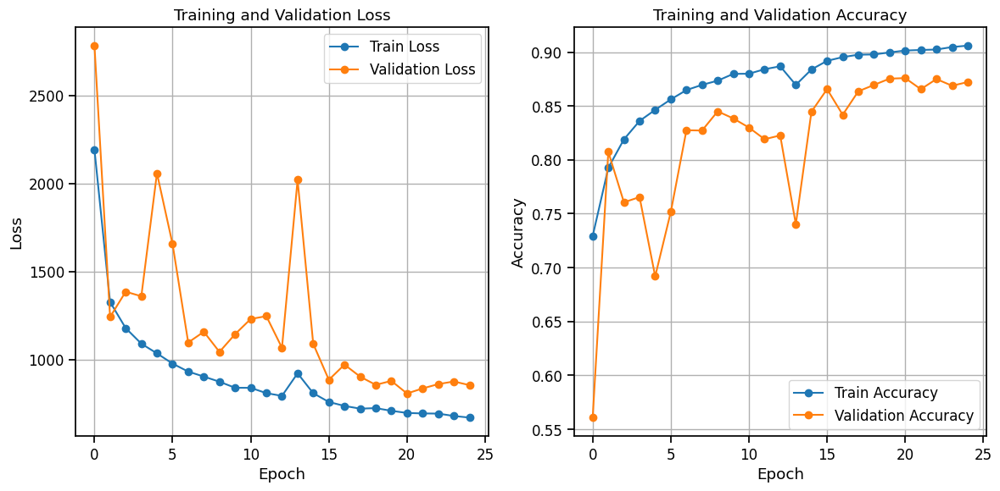

In [22]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Loss plot
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss', marker='o')
    plt.plot(history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy Plot
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy', marker='o')
    plt.plot(history['val_acc'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Show the plots
    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Function: Evaluating a model

In [23]:
def evaluate_model(model, dataloader, criterion):
    model.to(device)
    model.eval() # set the model in 'evaluation mode'

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    with torch.no_grad(): # disable gradient updates 
        for inputs, labels, _ in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            # prediction 
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # acummulate loss            
            total_loss += loss.item() * inputs.size(0)

            # count the number of correct
            _, preds = torch.max(outputs, 1)
            total_correct += (preds == labels).sum().item()
            total_samples += labels.size(0)

    # calculate average loss and accuracy
    avg_loss = total_loss / total_samples
    avg_acc = total_correct / total_samples
    return avg_loss, avg_acc

# evaluate on each dataset
train_loss, train_acc = evaluate_model(model, train_loader, criterion)
print(f'Training data -> loss: {train_loss:.3f}, acc: {train_acc:.3f}')

eval_loss, eval_acc = evaluate_model(model, val_loader, criterion)
print(f'Cross-val data -> loss: {eval_loss:.3f}, acc: {eval_acc:.3f}')

test_loss, test_acc = evaluate_model(model, test_loader, criterion)
print(f'Testing data -> loss: {test_loss:.3f}, acc: {test_acc:.3f}')

Training data -> loss: 988.958, acc: 0.875
Cross-val data -> loss: 856.075, acc: 0.872
Testing data -> loss: 832.780, acc: 0.872


# To save computing resources

In [24]:
# save the trained model
torch.save(model.state_dict(),"/kaggle/working/model.pth")

# release the GPU memory by deleting the model object
del model
torch.cuda.empty_cache()  # release cache on the GPU

In [25]:
# To reload the trained model;
# initialize the model (with initial weights and biases)
model, criterion, optimizer = build_model()
# load the weights and biases into the model
model.load_state_dict(torch.load("/kaggle/working/model.pth"))
model.to(device)

from torchinfo import summary
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 2]                    --
├─Conv2d: 1-1                            [1, 8, 96, 96]            224
├─ReLU: 1-2                              [1, 8, 96, 96]            --
├─BatchNorm2d: 1-3                       [1, 8, 96, 96]            16
├─MaxPool2d: 1-4                         [1, 8, 48, 48]            --
├─Conv2d: 1-5                            [1, 16, 48, 48]           1,168
├─ReLU: 1-6                              [1, 16, 48, 48]           --
├─BatchNorm2d: 1-7                       [1, 16, 48, 48]           32
├─MaxPool2d: 1-8                         [1, 16, 24, 24]           --
├─Conv2d: 1-9                            [1, 32, 22, 22]           4,640
├─ReLU: 1-10                             [1, 32, 22, 22]           --
├─BatchNorm2d: 1-11                      [1, 32, 22, 22]           64
├─MaxPool2d: 1-12                        [1, 32, 11, 11]           --
├─Conv2d

## Running Prediction

In [26]:
# Display sample from test dataset
print(f'Running predictions on {len(test_dataset)} test records...')

#test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
actuals, predictions = [], []

# Ensure model is in evaluation mode
model.eval()

with torch.no_grad(): # Disable gradient computation for inference
    for batch_no, (images, labels, _) in enumerate(test_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Get predictions
        outputs = model(images) # Forward pass
        preds = torch.argmax(outputs, dim=1) # Get class indices

        actuals.extend(labels.cpu().numpy().ravel())
        predictions.extend(preds.cpu().numpy().ravel())

# Convert lists to numpy arrays
actuals = np.array(actuals)
predictinos = np.array(predictions)

print('Sample actual values & predictions...')
print('  - Actual values: ', actuals[:32])
print('  - Precictions  : ', predictions[:32])

# Calculate accuracy
correct_preds = (actuals == predictions).sum()
acc = correct_preds / len(actuals)
print(f'  We got {correct_preds} of {len(actuals)} correct ({acc:.3f} accuracy)')

# Display classification report and confusion matrix
print(classification_report(actuals, predictions))
print('Confusion Matrix:')
print(confusion_matrix(actuals, predictions))

Running predictions on 13202 test records...
Sample actual values & predictions...
  - Actual values:  [1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 1 1 0]
  - Precictions  :  [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0]
  We got 11506 of 13202 correct (0.872 accuracy)
              precision    recall  f1-score   support

           0       0.86      0.93      0.90      7855
           1       0.89      0.78      0.83      5347

    accuracy                           0.87     13202
   macro avg       0.88      0.86      0.86     13202
weighted avg       0.87      0.87      0.87     13202

Confusion Matrix:
[[7338  517]
 [1179 4168]]


## Actual/Prediction Visualizer
If sample_predictions are provided, then each cell's title displays the prediction (if it matches actual) in green color, or actual/prediction if there is a mismatch, in red color.

torch.Size([64, 3, 96, 96]) torch.Size([64]) (64,)


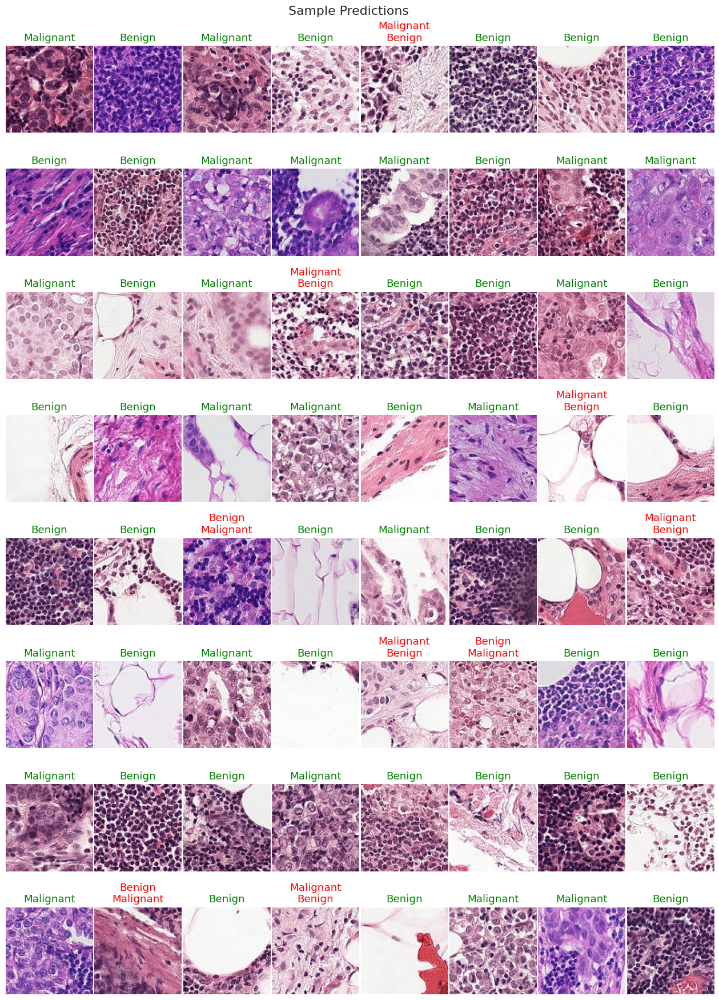

In [27]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(test_loader)

images, labels, _ = next(data_iter)

# model prediction
images = images.to(device) 
preds = model(images)
preds = torch.argmax(preds, dim=1).cpu().numpy()

# print the result
print(images.shape, labels.shape, preds.shape)

# plot the sample
display_sample(images.cpu().numpy(), labels.cpu().numpy(), sample_predictions=preds,
               grid_shape=(8, 8), fig_size=(16, 20), plot_title='Sample Predictions')

# Submission.csv Generator

Here we will start handling the 'real' test data in (/kaggle/input).  
Let's check the raw test data; how many files do we have.

In [28]:
# Set directory where the test data is
TEST_DATA_DIR = '/kaggle/input/histopathologic-cancer-detection/test'

# Real test dataset; we call it z_test_dataset
z_test_images = [f for f in os.listdir(TEST_DATA_DIR) if f.endswith('.tif')]
print(f'Number of z_test_images: {len(z_test_images)}')

Number of z_test_images: 57458


In [29]:
# Retrieve path and ids from z_test datasets
z_test_paths = []
z_test_ids = []

for f in os.listdir(TEST_DATA_DIR):
    z_test_paths.append(os.path.join(TEST_DATA_DIR, f)) # full path
    z_test_ids.append(os.path.splitext(f)[0]) # file name excluded '.tif'

# Prepare the dataset to feed dataloader
z_test_dataset = HistoDataset(z_test_paths, ids=z_test_ids, transforms=xforms['test'])
z_test_loader = DataLoader(z_test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

# Ensure model is in evaluation mode
model.eval()

# Store predictions
predictions = []
image_ids = [] 

# Generate predictions
with torch.no_grad():
    for batch_no, (images, ids) in enumerate(z_test_loader):
        images = images.to(device)

        # Get predictions
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        # Append results
        predictions.extend(preds.cpu().numpy())
        image_ids.extend(ids) 

# Create a submission DataFrame
submission = pd.DataFrame({
    'id': image_ids,
    'label': predictions
})

# Save to CSV
submission.to_csv('submission.csv', index=False)
print("Submission file created: submission.csv")

Submission file created: submission.csv


In [30]:
true_sub = pd.read_csv('/kaggle/working/submission.csv')
print(true_sub.shape)
true_sub[:10]

(57458, 2)


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,0
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,0
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,0
5,d23c66547f4a00555a174d2fcb860ae399b66edc,1
6,fabf2fca23f71655974767e29eda86a9b2c97a72,0
7,9730b15862516b8641b9f0ff48db660d95031c32,1
8,ee85348c0950c2e639776fb555e3452c1f8437c0,0
9,ef12a0813c504d2d1b2ba485e78d380ad64a0622,0


In [31]:
del model

# Conclusion

The primary code in this notebook is based on references to the GitHub page by Manish Bhobe.

The reason why this CNN achieves high accuracy despite its simple design is, in my opinion, due to Manish Bhobe’s meticulous focus on data preprocessing and hyperparameter tuning.

What his code teaches us is that in data science, the star of the show isn’t model building but the data itself. By carefully "cooking" the data, even simple models can deliver high-performance accuracy.

Additionally, his viewer-friendly code—such as visualizing prediction results with their corresponding labels—greatly enhances viewers' understanding and analysis.

The practice of saving and deleting models to improve memory efficiency and eliminate wasteful memory usage is another notable aspect.

For future endeavors, I plan to work on my own hyperparameter tuning, delve into the design of VGG and ResNet, and, after understanding Transformers, take on ViT.

Thank you for reading this notebook.


# Resources
Histopathological Cancer Detection - Binary Classification Kaggle Challenge by Manish Bhobe
https://github.com/mjbhobe/dl-pytorch/blob/master/Pytorch%20-%20Histopathology%20Detection%20-%20Binary%20Classification.ipynb